In [3]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import pyplot

In [5]:
data = pd.read_csv("data.csv", encoding = "ISO-8859-1")
data.head()

,iid,id,gender,idg,condtn,wave,round,position,positin1,order,...,attr3_3,sinc3_3,intel3_3,fun3_3,amb3_3,attr5_3,sinc5_3,intel5_3,fun5_3,amb5_3
0,1,1.0,0,1,1,1,10,7,NaN,4,...,5.0,7.0,7.0,7.0,7.0,NaN,NaN,NaN,NaN,NaN
1,1,1.0,0,1,1,1,10,7,NaN,3,...,5.0,7.0,7.0,7.0,7.0,NaN,NaN,NaN,NaN,NaN
2,1,1.0,0,1,1,1,10,7,NaN,10,...,5.0,7.0,7.0,7.0,7.0,NaN,NaN,NaN,NaN,NaN
3,1,1.0,0,1,1,1,10,7,NaN,5,...,5.0,7.0,7.0,7.0,7.0,NaN,NaN,NaN,NaN,NaN
4,1,1.0,0,1,1,1,10,7,NaN,7,...,5.0,7.0,7.0,7.0,7.0,NaN,NaN,NaN,NaN,NaN


In [6]:
data.shape

(8378, 195)

In [7]:
# afficher les index des colonnes avec leur nom 
for idx,column in enumerate(data.columns):
    print(idx,column)

0 iid
1 id
2 gender
3 idg
4 condtn
5 wave
6 round
7 position
8 positin1
9 order
10 partner
11 pid
12 match
13 int_corr
14 samerace
15 age_o
16 race_o
17 pf_o_att
18 pf_o_sin
19 pf_o_int
20 pf_o_fun
21 pf_o_amb
22 pf_o_sha
23 dec_o
24 attr_o
25 sinc_o
26 intel_o
27 fun_o
28 amb_o
29 shar_o
30 like_o
31 prob_o
32 met_o
33 age
34 field
35 field_cd
36 undergra
37 mn_sat
38 tuition
39 race
40 imprace
41 imprelig
42 from
43 zipcode
44 income
45 goal
46 date
47 go_out
48 career
49 career_c
50 sports
51 tvsports
52 exercise
53 dining
54 museums
55 art
56 hiking
57 gaming
58 clubbing
59 reading
60 tv
61 theater
62 movies
63 concerts
64 music
65 shopping
66 yoga
67 exphappy
68 expnum
69 attr1_1
70 sinc1_1
71 intel1_1
72 fun1_1
73 amb1_1
74 shar1_1
75 attr4_1
76 sinc4_1
77 intel4_1
78 fun4_1
79 amb4_1
80 shar4_1
81 attr2_1
82 sinc2_1
83 intel2_1
84 fun2_1
85 amb2_1
86 shar2_1
87 attr3_1
88 sinc3_1
89 fun3_1
90 intel3_1
91 amb3_1
92 attr5_1
93 sinc5_1
94 intel5_1
95 fun5_1
96 amb5_1
97 dec
98 attr

In [10]:
data.isnull().sum()

iid            0
id             1
gender         0
idg            0
condtn         0
            ... 
attr5_3     6362
sinc5_3     6362
intel5_3    6362
fun5_3      6362
amb5_3      6362
Length: 195, dtype: int64

In [14]:
# afficher les différents éléments de la colonne career_c
data.career_c.unique()

array([nan,  1.,  6.,  9.,  2.,  7., 10.,  5.,  3.,  4., 14., 11.,  8.,
       15., 12., 17., 13., 16.])

Text(0, 0.5, 'Nombre de date')

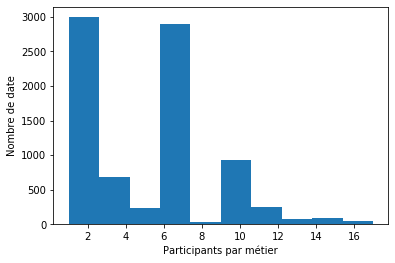

In [15]:
# repartition par métier des participants
career_c = data[np.isfinite(data["career_c"])]["career_c"]
plt.hist(career_c.values)
plt.xlabel("Participants par métier")
plt.ylabel('Nombre de date')

In [16]:
data.corr(method='spearman').style.format("{:.2}").background_gradient(cmap=plt.get_cmap('coolwarm'))

C:\Users\tatif\Anaconda3\lib\site-packages\matplotlib\colors.py:527: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


In [17]:
#Selection of key explicative factors.
new_data = ["iid","pid", "match", "gender", "career_c", "race", "zipcode", "imprelig", "goal", "attr1_1", "attr_o", "attr3_1", "attr4_1", "attr4_2", "attr4_3"]
data_new = data[new_data]
#Deletion of Nan in 'pid' column.
data_new.dropna(subset=['pid'],how='all', inplace=True)
data_new['pid'] = data_new['pid'].astype(int)

data_new.head()

C:\Users\tatif\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
C:\Users\tatif\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,iid,pid,match,gender,career_c,race,zipcode,imprelig,goal,attr1_1,attr_o,attr3_1,attr4_1,attr4_2,attr4_3
0,1,11,0,0,NaN,4.0,"60,521",4.0,2.0,15.0,6.0,6.0,NaN,NaN,NaN
1,1,12,0,0,NaN,4.0,"60,521",4.0,2.0,15.0,7.0,6.0,NaN,NaN,NaN
2,1,13,1,0,NaN,4.0,"60,521",4.0,2.0,15.0,10.0,6.0,NaN,NaN,NaN
3,1,14,1,0,NaN,4.0,"60,521",4.0,2.0,15.0,7.0,6.0,NaN,NaN,NaN
4,1,15,1,0,NaN,4.0,"60,521",4.0,2.0,15.0,8.0,6.0,NaN,NaN,NaN


In [18]:
data_new.isna().sum()

iid            0
pid            0
match          0
gender         0
career_c     138
race          63
zipcode     1063
imprelig      79
goal          79
attr1_1       79
attr_o       202
attr3_1      105
attr4_1     1879
attr4_2     2593
attr4_3     5409
dtype: int64

In [19]:
data_new.describe()

,iid,pid,match,gender,career_c,race,imprelig,goal,attr1_1,attr_o,attr3_1,attr4_1,attr4_2,attr4_3
count,8368.000000,8368.000000,8368.000000,8368.00000,8230.000000,8305.000000,8289.000000,8289.000000,8289.000000,8166.000000,8263.000000,6489.000000,5775.000000,2959.000000
mean,283.863767,283.863767,0.164914,0.50000,5.277886,2.756653,3.653879,2.121848,22.495347,6.190411,7.084352,26.394360,26.806234,25.610341
std,158.584899,158.584899,0.371125,0.50003,3.309885,1.230689,2.805641,1.406983,12.569802,1.950305,1.395527,16.297045,16.402836,17.477134
min,1.000000,1.000000,0.000000,0.00000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,2.000000,5.000000,6.000000,0.000000
25%,154.000000,154.000000,0.000000,0.00000,2.000000,2.000000,1.000000,1.000000,15.000000,5.000000,6.000000,10.000000,10.000000,10.000000
50%,281.000000,281.000000,0.000000,0.50000,6.000000,2.000000,3.000000,2.000000,20.000000,6.000000,7.000000,25.000000,25.000000,20.000000
75%,408.000000,408.000000,0.000000,1.00000,7.000000,4.000000,6.000000,2.000000,25.000000,8.000000,8.000000,35.000000,40.000000,37.000000
max,552.000000,552.000000,1.000000,1.00000,17.000000,6.000000,10.000000,6.000000,100.000000,10.500000,10.000000,95.000000,100.000000,80.000000


In [20]:
# remplacer les nan par des Unknown
data_new.race = data_new.race.apply(lambda x : "Unknown" if str(x) == "nan" else x)
data_new.career_c = data_new.career_c.apply(lambda x : "Unknown" if str(x) == "nan" else x)
data_new.imprelig = data_new.imprelig.apply(lambda x : "Unknown" if str(x) == "nan" else x)
data_new.zipcode = data_new.zipcode.apply(lambda x : "Unknown" if str(x) == "nan" else x)

data_new.isna().sum()

C:\Users\tatif\Anaconda3\lib\site-packages\pandas\core\generic.py:5208: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


iid            0
pid            0
match          0
gender         0
career_c       0
race           0
zipcode        0
imprelig       0
goal          79
attr1_1       79
attr_o       202
attr3_1      105
attr4_1     1879
attr4_2     2593
attr4_3     5409
dtype: int64

In [45]:
#Creating dataframe with interest values of both participants in each row
data_career = data.groupby("iid").mean()
data_career = data_career["career_c"].reset_index()
data_all = pd.merge(data_career, data, left_on = "iid", right_on = "pid", how='inner')
data_all.reset_index()

,index,iid_x,career_c_x,iid_y,id,gender,idg,condtn,wave,round,...,attr3_3,sinc3_3,intel3_3,fun3_3,amb3_3,attr5_3,sinc5_3,intel5_3,fun5_3,amb5_3
0,0,1,NaN,11,1.0,1,2,1,1,10,...,7.0,8.0,7.0,7.0,5.0,NaN,NaN,NaN,NaN,NaN
1,1,1,NaN,12,2.0,1,4,1,1,10,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,1,NaN,13,3.0,1,6,1,1,10,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,1,NaN,14,4.0,1,8,1,1,10,...,9.0,9.0,9.0,9.0,9.0,NaN,NaN,NaN,NaN,NaN
4,4,1,NaN,15,5.0,1,10,1,1,10,...,7.0,7.0,9.0,7.0,9.0,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8363,8363,552,15.0,526,18.0,0,35,2,21,22,...,4.0,3.0,3.0,7.0,7.0,2.0,4.0,4.0,7.0,7.0
8364,8364,552,15.0,527,19.0,0,37,2,21,22,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8365,8365,552,15.0,528,20.0,0,39,2,21,22,...,9.0,8.0,9.0,10.0,10.0,9.0,10.0,9.0,10.0,10.0
8366,8366,552,15.0,529,21.0,0,41,2,21,22,...,6.0,10.0,7.0,8.0,7.0,6.0,9.0,7.0,8.0,8.0


In [46]:
#Remplacer des Nan par des 0/1 dans les colonnes professions de la personne 1 et 2
data_all.career_c_x = data_all.career_c_x.apply(lambda x : 0 if str(x) == "nan" else x)
data_all.career_c_y = data_all.career_c_y.apply(lambda x : 0 if str(x) == "nan" else x)

In [47]:
data_all.career_c_x.unique(), data_all.career_c_y.unique()

(array([ 0.,  1.,  6.,  9.,  2.,  7., 10.,  5.,  3.,  4., 14., 11.,  8.,
        15., 12., 17., 13., 16.]),
 array([ 2.,  1.,  7.,  0.,  6.,  9.,  5.,  4., 10.,  3., 14., 11.,  8.,
        15., 12., 17., 13., 16.]))

In [48]:
#Conversion des idd en nombre entier.
data_all["iid_y"] = data_all["iid_y"].astype('int64')

In [65]:
#création d'une colonne "compatible" informant s'il y é coïncidence des professions des deux personnes.
data_all.compatible = pd.Series([])

In [59]:
data_all.career_c_y.value_counts()

2.0     2320
7.0     2169
6.0      723
1.0      673
9.0      547
4.0      418
10.0     377
3.0      261
5.0      233
11.0     220
0.0      138
13.0      81
15.0      77
16.0      44
8.0       39
12.0      28
14.0      10
17.0      10
Name: career_c_y, dtype: int64

In [60]:
#on remplit la colonne indiquant si les deux professions coïncident
for i in range(0, len(data_all)):
  if data_all.career_c_y[i] == data_all.career_c_x[i]:
    data_all.compatible[i] = 1
  else:
    data_all.compatible[i] = 0

In [61]:
data_all.compatible.unique()

array([0, 1], dtype=int64)

In [62]:
#on va quantitier les dates ayant aboutit à des matchs lorsque les deux individus ont théoriquement des affinités.
pie_chart_data = data_all.compatible.value_counts()

In [63]:
pie_chart_data

0    6872
1    1496
dtype: int64

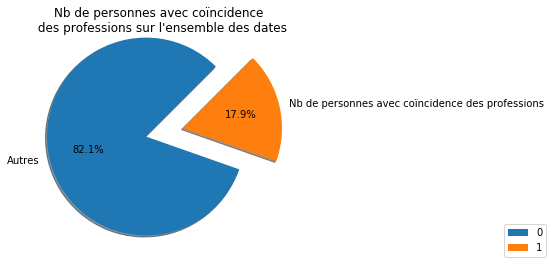

In [64]:
## Création du pie chart: coïncidence des professions sur l'ensemble des dates.
fig, ax = plt.subplots(figsize=(9,3.5))
m=plt.pie(pie_chart_data, labels=["Autres","Nb de personnes avec coïncidence des professions"], 
          explode=(0.2, 0.3),
          autopct='%1.1f%%',
          shadow=True, startangle=45,
          radius=1.3
          )
fig.legend(pie_chart_data.index, loc="lower right")
plt.title("Nb de personnes avec coïncidence \n des professions sur l'ensemble des dates")
plt.show()

In [56]:
pie_chart_data

0    6872
1    1496
dtype: int64

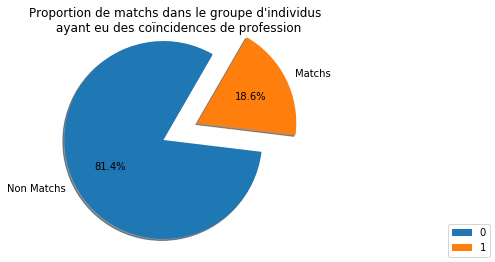

In [44]:
#on va visualiser la part de matchs parmi le groupe d'individus ayant eu une coïncidence des professions.
pie_chart_data2 = data_all.match[data_all.compatible==1].value_counts()

fig, ax = plt.subplots(figsize=(9,3.5))
m=plt.pie(pie_chart_data2, labels=["Non Matchs","Matchs"],
          explode=(0.2, 0.3),
          autopct='%1.1f%%',
          shadow=True, startangle=60,
          radius=1.3
          )
fig.legend(pie_chart_data2.index, loc="lower right")
plt.title("Proportion de matchs dans le groupe d'individus \n ayant eu des coïncidences de profession")
plt.show()


In [57]:
pie_chart_data2

0    1218
1     278
Name: match, dtype: int64